In [1]:
%reload_ext autoreload
%autoreload 2

---

<img src="assets/idal-logo.png" align="right" style="float" width="400">
<font color="#CA3532"><h1 align="left">Máster IA3 - Aprendizaje profundo (I y II)</h1></font>
<font color="#37A61F"><h2 align="left">DUPCHI</h2></font>
<font color="#37A61F"><h3 align="left">Denoise, Upscale and Predict Cancer from Histopathological Images</h3></font>

<font color="#15A3CA"><h2 align="left">Javier Yago Córcoles</h2></font>
<font color="#15A3CA"><h4 align="left">Data Scientist</h4></font>

---

In [2]:
import tensorflow as tf
from PIL import Image
import os
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from keras.applications.densenet import preprocess_input, DenseNet121
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import warnings
import keras
from dupchi.models.ESRGAN.predict import upscale_images
from keras.layers import Dense,Flatten
from keras.models import Model
from keras.optimizers import Adam
from datetime import datetime
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import layers, models

warnings.filterwarnings('ignore',category=FutureWarning)

physical_devices = tf.config.list_physical_devices('GPU')
print(physical_devices)
tf.config.experimental.set_memory_growth(physical_devices[0], True)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


---

## ACLARACIÓN:

Para la preparación de datos y el entrenamiento tanto del Autoencoder como de Resnet, se ha utilizado el código presente en el notebook `ae_resnet_training.ipynb` ejecutado en Google Colab.

---

## Preparación de los datos

### Carga y preprocesamiento de los datos

In [3]:
images_list = []
root_folder = '../data/lung_colon_image_set'

img_height = 224
img_width = 224

for foldername in os.listdir(root_folder):
    filepath = os.path.join(root_folder, foldername)
    for image_name in os.listdir(filepath):
        image_name = Image.open(os.path.join(filepath, image_name))
        image_name = image_name.resize((img_height, img_width), resample=Image.BICUBIC).convert("RGB")
        images_list.append(image_name)
    
print(len(images_list))

6250


In [4]:
images_array = np.array([np.array(img) for img in images_list], dtype= 'object')
images_array = images_array.astype('float32') / 255.
images_array = np.reshape(images_array, (len(images_array), img_height, img_width, 3))

In [5]:
indices = list(range(len(images_list)))

train_indices, test_indices = train_test_split(indices, test_size=0.1, random_state=42)

train_indices, val_indices = train_test_split(train_indices, test_size=0.20, random_state=42)

train_images = np.array([images_array[i] for i in train_indices])
val_images = np.array([images_array[i] for i in val_indices])
test_images = np.array([images_array[i] for i in test_indices])

print('train_images.shape: ', train_images.shape)
print('val_images.shape: ', val_images.shape)
print('test_images.shape: ', test_images.shape)

train_images.shape:  (4500, 224, 224, 3)
val_images.shape:  (1125, 224, 224, 3)
test_images.shape:  (625, 224, 224, 3)


### Preparación de los datos del Autoencoder (se ha usado el código de `ae_resnet_training.ipynb`)

In [8]:
# Función para añadir ruido
def add_noise_numpy(image, noise_factor=0.07):
    noise = np.random.normal(0, noise_factor, image.shape)
    noisy_image = image + noise * 255
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
    return noisy_image

noisy_images_list = []
for img in images_list:
    image_np = np.array(img)
    noisy_image_np = add_noise_numpy(image_np)
    noisy_image = Image.fromarray(noisy_image_np)
    noisy_images_list.append(noisy_image)

(-0.5, 223.5, 223.5, -0.5)

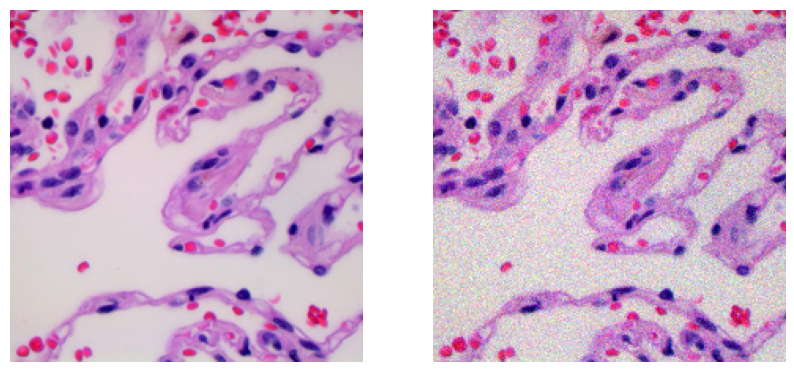

In [9]:
fig, axs = plt.subplots(1, 2, figsize=(10, 10))

axs[0].imshow(images_list[0])
axs[0].axis('off')
axs[1].imshow(noisy_images_list[0])
axs[1].axis('off')

In [ ]:
noisy_images_array = np.array([np.array(img) for img in noisy_images_list], dtype= 'object')
noisy_images_array = noisy_images_array.astype('float32') / 255.
noisy_images_array = np.reshape(noisy_images_array, (len(noisy_images_array), img_height, img_width, 3))

print('images_array.shape: ', images_array.shape)
print('noisy_images_array.shape: ', noisy_images_array.shape)

In [10]:
train_noisy_images = np.array([noisy_images_array[i] for i in train_indices])
val_noisy_images = np.array([noisy_images_array[i] for i in val_indices])
test_noisy_images = np.array([noisy_images_array[i] for i in test_indices])

print('train_noisy_images: ', train_noisy_images.shape)
print('val_noisy_images: ', val_noisy_images.shape)
print('test_noisy_images: ', test_noisy_images.shape)

train_noisy_images:  (4500, 128, 128, 3)
val_noisy_images:  (1125, 128, 128, 3)
test_noisy_images:  (625, 128, 128, 3)


In [9]:
# guardar en la carpeta data tres muestras de imágenes con ruido y sin ruido

for i in range(3):
    img = Image.fromarray((train_images[i] * 255).astype(np.uint8))
    img.save(f'../data/train_clean_{i}.png')
    img = Image.fromarray((train_noisy_images[i] * 255).astype(np.uint8))
    img.save(f'../data/train_noisy_{i}.png')

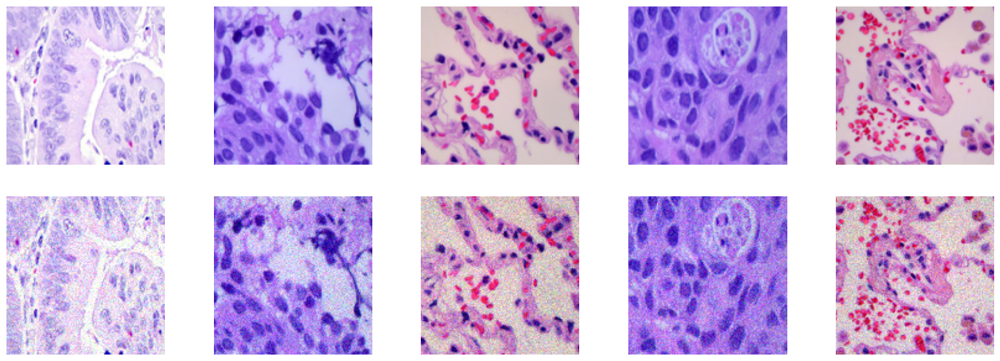

In [9]:
fig, axs = plt.subplots(2, 5, figsize=(20, 7))

for i in range(5):
    axs[0, i].imshow(train_images[i])
    axs[0, i].axis('off')
    axs[1, i].imshow(train_noisy_images[i])
    axs[1, i].axis('off')

### Preparación de los datos de la CNN (se ha usado el código de `ae_resnet_training.ipynb`)

In [9]:
train_datagen = ImageDataGenerator(
    preprocessing_function = preprocess_input ,
    rotation_range = 40 ,
    width_shift_range = 0.2 ,
    height_shift_range = 0.2 ,
    shear_range = 0.2 ,
    zoom_range = 0.2 ,
    horizontal_flip = True ,
    fill_mode = 'nearest'
)

test_datagen = ImageDataGenerator(
    preprocessing_function = preprocess_input ,
    rotation_range = 40 ,
    width_shift_range = 0.2 ,
    height_shift_range = 0.2 ,
    shear_range = 0.2 ,
    zoom_range = 0.2 ,
    horizontal_flip = True ,
    fill_mode = 'nearest'
)

In [10]:
train_path = '../data/lung_colon_image_set_2/train'
test_path = '../data/lung_colon_image_set_2/validation'

# train data
train_set = train_datagen.flow_from_directory(train_path,
                                             target_size = (512, 512),
                                             batch_size = 16,
                                             class_mode = 'categorical')

# test data
test_set = test_datagen.flow_from_directory(test_path,
                                            target_size = (512, 512),
                                            batch_size = 16,
                                            class_mode = 'categorical')

Found 4375 images belonging to 5 classes.
Found 1875 images belonging to 5 classes.


## Entrenamiento del Autoencoder (`ae_resnet_training.ipynb`)

### Train

In [22]:
def build_deep_autoencoder(input_shape=(128, 128, 3)):

    # Codificador
    encoder_input = layers.Input(shape=input_shape, name='encoder_input')
    x = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(encoder_input)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)

    # Decodificador
    x = layers.Conv2DTranspose(128, (3, 3), strides=2, activation='relu', padding='same')(x)
    x = layers.Conv2DTranspose(64, (3, 3), strides=2, activation='relu', padding='same')(x)
    x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation='relu', padding='same')(x)
    x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation='relu', padding='same')(x)
    decoder_output = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

    # Autoencoder = Codificador + Decodificador
    autoencoder = models.Model(encoder_input, decoder_output, name='deep_autoencoder')

    return autoencoder

def build_improved_deep_autoencoder(input_shape=(128, 128, 3)):
    # Codificador
    encoder_input = layers.Input(shape=input_shape, name='encoder_input')
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(encoder_input)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)

    # Decodificador
    x = layers.Conv2DTranspose(256, (3, 3), strides=2, activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(128, (3, 3), strides=2, activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(64, (3, 3), strides=2, activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation='relu', padding='same')(x)
    decoder_output = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

    # Autoencoder = Codificador + Decodificador
    autoencoder = models.Model(encoder_input, decoder_output, name='improved_deep_autoencoder')

    return autoencoder

# Construir el autoencoder
deep_autoencoder = build_improved_deep_autoencoder(input_shape=(128, 128, 3))

# Compilar el modelo
with tf.device('/GPU:0'):
    optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0005)
    early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=25, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(factor = 0.3, patience = 8, verbose = 1)
    deep_autoencoder.compile(optimizer= optimizer, loss='mean_squared_error')

# Resumen del modelo
deep_autoencoder.summary()


Model: "improved_deep_autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_input (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_4              │ (None, 16, 16, 256)    │       590,080 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_5              │ (None, 32, 32, 128)    │       295,040 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_6              │ (None, 64, 64, 64)     │        73,792 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_7              │ (None, 128, 128, 32)   │        18,46

 Total params: 1,370,371 (5.23 MB)

 Trainable params: 1,368,515 (5.22 MB)

 Non-trainable params: 1,856 (7.25 KB)

In [23]:
history = deep_autoencoder.fit(train_noisy_images, train_images,
                                epochs=1000,
                                batch_size=8,
                                callbacks = [early_stopping, lr_scheduler],
                                shuffle=True,
                                validation_data=(val_noisy_images, val_images))

2024-04-13 20:26:06.159277: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 884736000 exceeds 10% of free system memory.


Epoch 1/1000
563/563 ━━━━━━━━━━━━━━━━━━━━ 12s 15ms/step - loss: 0.0209 - val_loss: 0.0087 - learning_rate: 5.0000e-04
Epoch 2/1000
563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0086 - val_loss: 0.0072 - learning_rate: 5.0000e-04
Epoch 3/1000
563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0073 - val_loss: 0.0074 - learning_rate: 5.0000e-04
Epoch 4/1000
563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0066 - val_loss: 0.0063 - learning_rate: 5.0000e-04
Epoch 5/1000
563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0063 - val_loss: 0.0063 - learning_rate: 5.0000e-04
Epoch 6/1000
563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0058 - val_loss: 0.0058 - learning_rate: 5.0000e-04
Epoch 7/1000
563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0056 - val_loss: 0.0057 - learning_rate: 5.0000e-04
Epoch 8/1000
563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0054 - val_loss: 0.0055 - learning_rate: 5.0000e-04
Epoch 9/1000
563/563 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0052 -

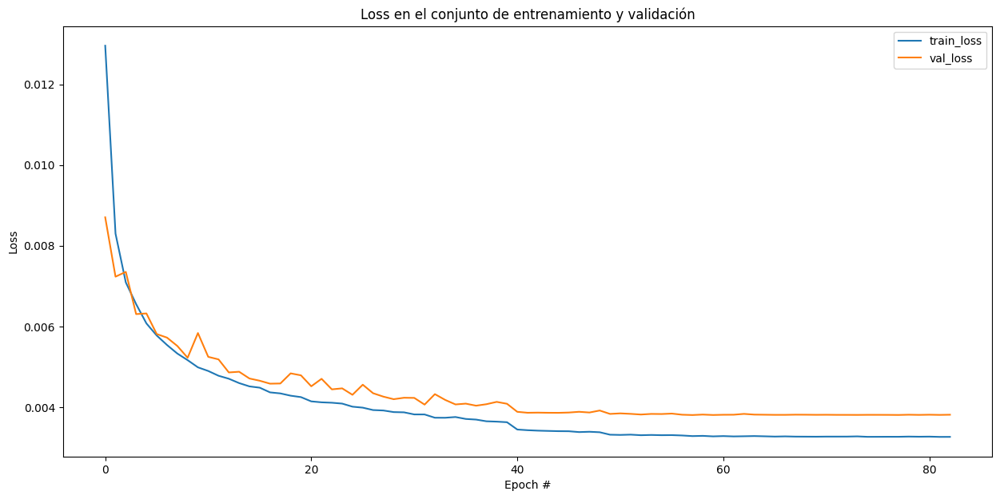

In [24]:
plt.figure(figsize=(15, 7))
plt.plot(np.arange(0, len(history.history["loss"])), history.history["loss"], label="train_loss")
plt.plot(np.arange(0, len(history.history["val_loss"])), history.history["val_loss"], label="val_loss")
plt.title("Loss en el conjunto de entrenamiento y validación")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [25]:
deep_autoencoder.save('autoencoder.keras')

### Predict

In [11]:
deep_autoencoder = keras.models.load_model('autoencoder.keras')

2024-04-13 21:35:04.814257: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-04-13 21:35:04.814414: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-04-13 21:35:04.814446: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-04-13 21:35:04.977214: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-04-13 21:35:04.977292: I external/local_xla/xla/stream_executor

In [12]:
prediction = deep_autoencoder.predict(test_noisy_images)

2024-04-13 21:35:09.309632: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 122880000 exceeds 10% of free system memory.
2024-04-13 21:35:09.368410: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 122880000 exceeds 10% of free system memory.
I0000 00:00:1713036909.553887   58873 service.cc:145] XLA service 0x7fafe0051f50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1713036909.553926   58873 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 3070 Ti, Compute Capability 8.6
2024-04-13 21:35:09.581650: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-04-13 21:35:09.773237: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907


18/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

I0000 00:00:1713036911.665406   58873 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step


2024-04-13 21:35:12.894589: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 122880000 exceeds 10% of free system memory.


(-0.5, 127.5, 127.5, -0.5)

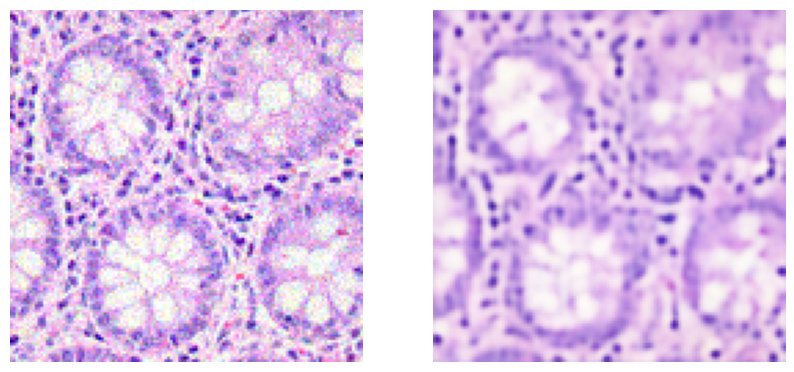

In [13]:
fig, axs = plt.subplots(1, 2, figsize=(10, 10))

axs[0].imshow(test_noisy_images[9])
axs[0].axis('off')
axs[1].imshow(prediction[9])
axs[1].axis('off')

(-0.5, 127.5, 127.5, -0.5)

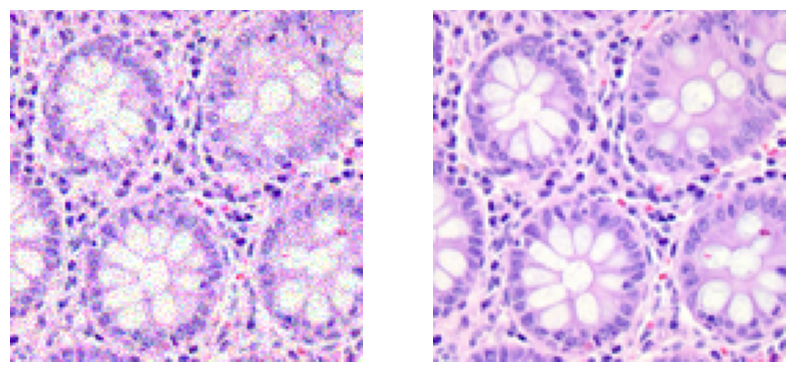

In [20]:
fig, axs = plt.subplots(1, 2, figsize=(10, 10))

axs[0].imshow(test_noisy_images[9])
axs[0].axis('off')
axs[1].imshow(test_images[9])
axs[1].axis('off')

In [19]:
for i in range(5):
    reconstructed_image = prediction[i]
    print(reconstructed_image.shape)
    reconstructed_image = Image.fromarray((reconstructed_image * 255).astype(np.uint8))
    reconstructed_image.save(f'reconstructed_image_{i}.png')

(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)


## Prueba de la ESRGAN

In [2]:
lr_folder_name = '../data/test_images/'
hr_folder_name = '../data/test_images_hr/'

upscale_images(lr_folder_name, hr_folder_name)

=> Loading checkpoint


(-0.5, 1535.5, 1535.5, -0.5)

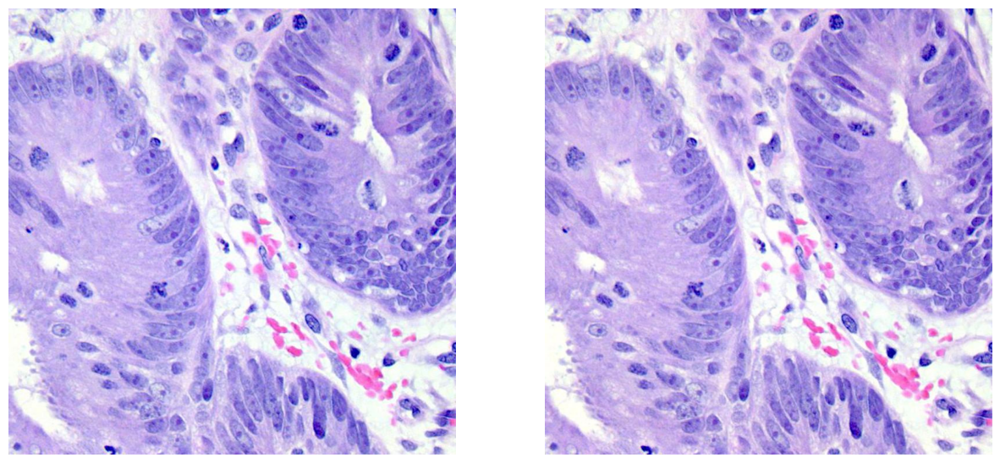

In [3]:
fig, axs = plt.subplots(1, 2, figsize=(15, 15))

axs[0].imshow(Image.open(lr_folder_name + 'colonca3751.jpeg'))
axs[0].axis('off')
axs[1].imshow(Image.open(hr_folder_name + 'colonca3751.jpeg'))
axs[1].axis('off')

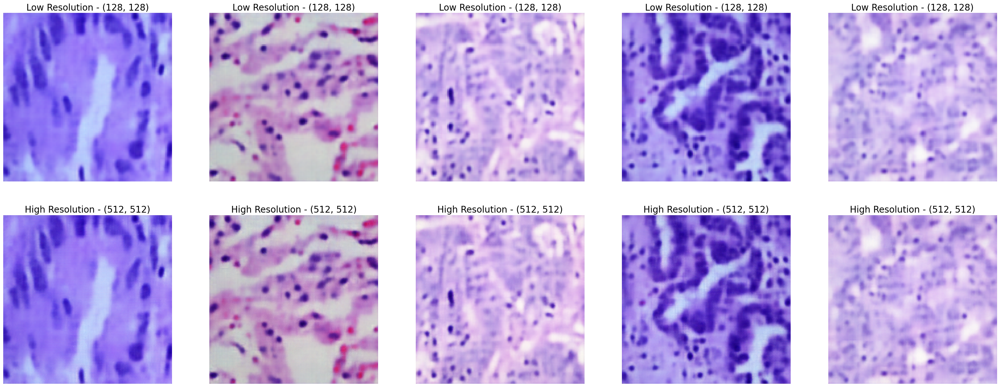

In [23]:
lr_folder_name = '../data/test_images/'
hr_folder_name = '../data/test_images_hr/'

fig, axs = plt.subplots(2, 5, figsize=(40, 15))

for num, i in enumerate(os.listdir(lr_folder_name)):
    lr_image = Image.open(lr_folder_name + i)
    axs[0, num].imshow(lr_image)
    axs[0, num].axis('off')
    axs[0, num].set_title(f'Low Resolution - {lr_image.size}', fontsize=20)

    hr_image = Image.open(hr_folder_name + i)
    axs[1, num].imshow(hr_image)
    axs[1, num].axis('off')
    axs[1, num].set_title(f'High Resolution - {hr_image.size}', fontsize=20)

(-0.5, 511.5, 511.5, -0.5)

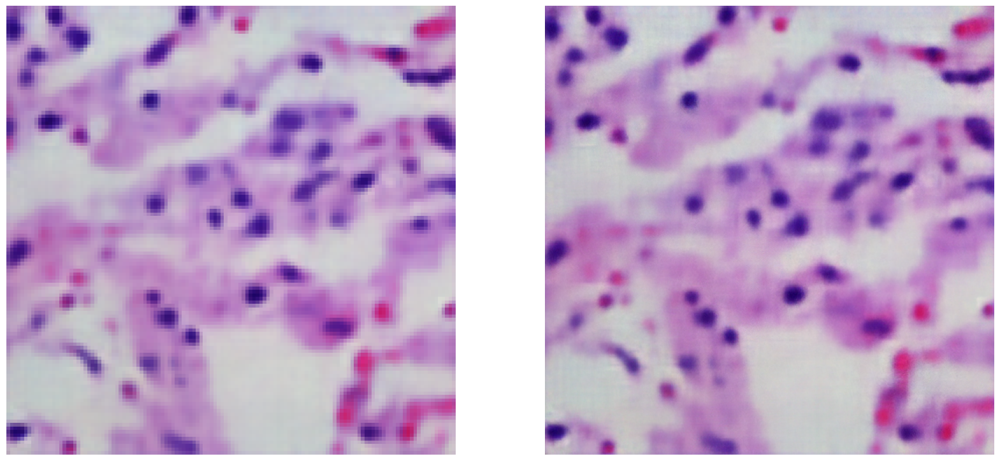

In [25]:
import matplotlib.pyplot as plt
from PIL import Image

fig, axs = plt.subplots(1, 2, figsize=(20, 20))

axs[0].imshow(Image.open(lr_folder_name + 'reconstructed_image_1.png'))
axs[0].axis('off')
axs[1].imshow(Image.open(hr_folder_name + 'reconstructed_image_1.png'))
axs[1].axis('off')

## Entrenamiento CNN (`ae_resnet_training.ipynb`)

### Train

In [4]:
# setting image size 
IMAGE_SIZE = [512, 512, 3]

# Load the model 
densenet = DenseNet121(include_top = False,
                input_shape = IMAGE_SIZE,
                    weights = 'imagenet')

# Visualize the model
densenet.summary()

Model: "densenet121"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 518, 518,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 256, 256,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 256, 256,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 256, 256,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 258, 258,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 128, 128,  │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 128, 128,  │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 128, 128,  │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 128, 128,  │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 128, 128,  │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 128, 128,  │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 128, 128,  │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 128, 128,  │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 128, 128,  │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 128, 128,  │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 128, 128,  │     12,288 │ conv2_block2_0_r

 Total params: 7,037,504 (26.85 MB)

 Trainable params: 6,953,856 (26.53 MB)

 Non-trainable params: 83,648 (326.75 KB)

In [5]:
for layer in densenet.layers:
    layer.trainable = False

In [6]:
# Flattened the last layer
x = Flatten()(densenet.output)

# Created a new layer as output
prediction = Dense(5, activation = 'softmax')(x)

# Join it with the model
model = Model(inputs = densenet.input , outputs = prediction)

# Visualize the model again
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 518, 518,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 256, 256,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 256, 256,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 256, 256,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 258, 258,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 128, 128,  │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 128, 128,  │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 128, 128,  │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 128, 128,  │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 128, 128,  │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 128, 128,  │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 128, 128,  │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 128, 128,  │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 128, 128,  │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 128, 128,  │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 128, 128,  │     12,288 │ conv2_block2_0_r

 Total params: 8,348,229 (31.85 MB)

 Trainable params: 1,310,725 (5.00 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [7]:
# defining adam
adam=Adam(learning_rate=0.00001)

# compining the model
model.compile( loss = 'categorical_crossentropy',
              optimizer = adam,
              metrics = ['accuracy'] )

Entrenamiento realizado en Google Colab (entorno de ejecución con una GPU A100)

In [ ]:
checkpoint = ModelCheckpoint(filepath = 'densenet121.keras' , verbose = 2 , save_best_only = True)
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=20, restore_best_weights=True)
callbacks = [checkpoint, early_stopping]
start = datetime.now()
model_history = model.fit(train_set,
                          validation_data = test_set,
                          epochs = 1000,
                          steps_per_epoch = 5,
                          validation_steps = 32,
                          callbacks = callbacks,
                          verbose = 2)

duration = datetime.now() - start

print('Total elapsed time : ',duration)

### Predict

In [4]:
densenet = keras.models.load_model('densenet121.keras')

In [11]:
test_loss, test_accuracy = densenet.evaluate(test_set, steps = 32)
print('Test loss: ', test_loss)
print('Test accuracy: ', test_accuracy)

/home/yago/miniconda3/envs/dupchi/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1711991774.963690   11815 service.cc:145] XLA service 0x7f3058004a50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1711991774.963733   11815 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 3070 Ti, Compute Capability 8.6
2024-04-01 19:16:15.098054: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-04-01 19:16:15.881860: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907


 2/32 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - accuracy: 0.9688 - loss: 0.1728  

I0000 00:00:1711991793.418210   11815 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


32/32 ━━━━━━━━━━━━━━━━━━━━ 35s 421ms/step - accuracy: 0.9385 - loss: 0.1866
Test loss:  0.17519474029541016
Test accuracy:  0.9375


In [34]:
def densenet_predict(img_path:str = None):
    # preprocess
    test_image = Image.open(img_path)
    test_image = test_image.resize((512, 512), resample=Image.BICUBIC).convert("RGB")
    test_image = np.array(test_image)
    test_image = test_image.astype('float32') / 255.
    test_image = np.reshape(test_image, (1, 512, 512, 3))

    # predict
    prediction = densenet.predict(test_image)

    # decode the prediction
    class_labels = ['colon_aca', 'colon_n', 'lung_aca', 'lung_n', 'lung_scc']
    top_3_indices = np.argsort(prediction[0])[-3:][::-1]
    top_3_values = prediction[0][top_3_indices]
    top_3_labels = [class_labels[i] for i in top_3_indices]

    for label, value in zip(top_3_labels, top_3_values):
        print(f"{label}: {value:.4f}")

    print('-------> Top 1 prediction: ', top_3_labels[0])

    return top_3_labels[0], top_3_values[0]

In [35]:
predicted_class, confidence = densenet_predict('lungscc37.jpeg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
lung_scc: 0.9955
colon_aca: 0.0041
lung_aca: 0.0004
-------> Top 1 prediction:  lung_scc


In [36]:
print('Predicted class: ', predicted_class)
print('Confidence: ', confidence)

Predicted class:  lung_scc
Confidence:  0.9955124


## Building the CNN dataset

In [4]:
autoencoder = keras.models.load_model('./model_checkpoints/autoencoder.keras')

def process_autoencoder(image):
    """
    Process the image by adding noise
    """

    image_np = np.array(image.resize((224, 224), resample=Image.BICUBIC).convert("RGB"))

    noise = np.random.normal(0, 0.12, image_np.shape)
    noisy_image_np = image_np + noise * 255
    noisy_image_np = np.clip(noisy_image_np, 0, 255).astype(np.uint8)

    noisy_image = noisy_image_np.astype('float16') / 255.
    noisy_image = np.reshape(noisy_image, (1, 224, 224, 3))

    denoised_image = autoencoder.predict(noisy_image)

    return denoised_image

def upscale_images_esrgan(hr_folder, lr_folder):
    """
    Upscale the image with the pre-trained ESRGAN
    """

    upscale_images(lr_folder, hr_folder)

    return



In [5]:
split_list = ['test', 'train', 'validation']
label_list = ['colon_aca','colon_n', 'lung_aca', 'lung_n', 'lung_scc']

for split in split_list:
    for label in label_list:
        # if not os.path.exists(f'../data/lung_colon_image_set_cnn/{split}/{label}'):
        #     os.makedirs(f'../data/lung_colon_image_set_cnn/{split}/{label}')

        for file in os.listdir(f'../data/lung_colon_image_set_cnn/{split}/{label}'):
            image = Image.open(f'../data/lung_colon_image_set_cnn/{split}/{label}/{file}')
            denoised_image = process_autoencoder(image)
            denoised_image_pil = Image.fromarray((denoised_image[0] * 255).astype(np.uint8))
            denoised_image_pil.save(f'../data/lung_colon_image_set_cnn/{split}/{label}/{file}')

            os.remove(f'../data/lung_colon_image_set_cnn/{split}/{label}/{file}')
            png_name = file.split('.')[0] + '.png'
            denoised_image_pil.save(f'../data/lung_colon_image_set_cnn/{split}/{label}/{png_name}')

I0000 00:00:1713643669.790091   50235 service.cc:145] XLA service 0x7f9abc0051d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1713643669.790125   50235 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 3070 Ti, Compute Capability 8.6
2024-04-20 22:07:49.815079: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-04-20 22:07:49.930216: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


I0000 00:00:1713643671.499656   50235 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━

In [7]:
split_list = ['test', 'train', 'validation']
label_list = ['colon_aca','colon_n', 'lung_aca', 'lung_n', 'lung_scc']

for split in split_list:
    for label in label_list:
        # if not os.path.exists(f'../data/lung_colon_image_set_cnn/{split}/{label}_hr'):
        #     os.makedirs(f'../data/lung_colon_image_set_cnn/{split}/{label}_hr')
        upscale_images(f'../data/lung_colon_image_set_cnn/{split}/{label}', f'../data/lung_colon_image_set_cnn/{split}/{label}_hr')

=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint


## Prueba GCP

In [24]:
from google.cloud import storage
import matplotlib.pyplot as plt
from PIL import Image


def list_blobs(bucket_name):
    """Lists all the blobs in the bucket."""
    # bucket_name = "dupchi_test_images"

    storage_client = storage.Client()

    # Note: Client.list_blobs requires at least package version 1.17.0.
    blobs = storage_client.list_blobs(bucket_name)

    # Note: The call returns a response only when the iterator is consumed.
    for blob in blobs:
        print('/'.join(blob.name.split('/')[1:]))

        # fig, axs = plt.subplots(1, 2, figsize=(15, 15))

        # axs[0].imshow(Image.open(blob.name))
        # axs[0].axis('off')

        # break

In [15]:
def download_blob(bucket_name, source_blob_name, destination_file_name):
    """Downloads a blob from the bucket."""
    # The ID of your GCS bucket
    # bucket_name = "your-bucket-name"

    # The ID of your GCS object
    # source_blob_name = "storage-object-name"

    # The path to which the file should be downloaded
    # destination_file_name = "local/path/to/file"

    storage_client = storage.Client()

    bucket = storage_client.bucket(bucket_name)

    # Construct a client side representation of a blob.
    # Note `Bucket.blob` differs from `Bucket.get_blob` as it doesn't retrieve
    # any content from Google Cloud Storage. As we don't need additional data,
    # using `Bucket.blob` is preferred here.
    blob = bucket.blob(source_blob_name)
    blob.download_to_filename(destination_file_name)

    print(
        "Downloaded storage object {} from bucket {} to local file {}.".format(
            source_blob_name, bucket_name, destination_file_name
        )
    )

In [25]:
list_blobs("dupchi_test_images")

colon_image_sets/colon_aca/colonca1251.jpeg
colon_image_sets/colon_aca/colonca1252.jpeg
colon_image_sets/colon_aca/colonca1253.jpeg
colon_image_sets/colon_aca/colonca1254.jpeg
colon_image_sets/colon_aca/colonca1255.jpeg
colon_image_sets/colon_aca/colonca1256.jpeg
colon_image_sets/colon_aca/colonca1257.jpeg
colon_image_sets/colon_aca/colonca1258.jpeg
colon_image_sets/colon_aca/colonca1259.jpeg
colon_image_sets/colon_aca/colonca1260.jpeg
colon_image_sets/colon_aca/colonca1261.jpeg
colon_image_sets/colon_aca/colonca1262.jpeg
colon_image_sets/colon_aca/colonca1263.jpeg
colon_image_sets/colon_aca/colonca1264.jpeg
colon_image_sets/colon_aca/colonca1265.jpeg
colon_image_sets/colon_aca/colonca1266.jpeg
colon_image_sets/colon_aca/colonca1267.jpeg
colon_image_sets/colon_aca/colonca1268.jpeg
colon_image_sets/colon_aca/colonca1269.jpeg
colon_image_sets/colon_aca/colonca1270.jpeg
colon_image_sets/colon_aca/colonca1271.jpeg
colon_image_sets/colon_aca/colonca1272.jpeg
colon_image_sets/colon_aca/colon

In [19]:
download_blob("dupchi_test_images", "lung_colon_image_set_test/colon_image_sets/colon_aca/colonca1251.jpeg", "tmp/test.png")

Downloaded storage object lung_colon_image_set_test/colon_image_sets/colon_aca/colonca1251.jpeg from bucket dupchi_test_images to local file tmp/test.png.
